# Midterm Notebook
######  Paige DeFiori
This notebook is an application of what I have learned thus far in the quarter, mainly with Plotly express, to explore a metadataset on COVID. This is directed at directed at my partner and I's research questions pertaining to the pandemic: specifically, we are seeking to identify the correlation between the socioeconomic status of each country, the rate of infectection, and the rate of vaccination. This notebook explores a COVID dataset downloaded from [Our World in Data](https://ourworldindata.org/covid-cases), which is updated on a daily basis from many differnt global sources. I will be focusing on the progression of COVID from January 2020 to Fedbruary 2nd 2021, this leads to our visualisations being the most up to date as possible. This meta data I will use is reported and updated by .csv and used by many noteworthy hosiptals and nations, like Johns Hopkins University and the European Centre for Disease Prevention and Control.

## Data Exploration

### Clean the Data

First and for most, I need to import all the libaries needed to read datasets and turn them into visualizations:

In [1]:
# for general data wrangling tasks
import pandas as pd

# to read and visualize spatial data
import geopandas as gpd
from geopandas import GeoDataFrame

from shapely.geometry import Point

# for plotting / figures
import matplotlib.pyplot as plt

# this allows .csv files to be turned into visualizations (mainly for choropleth maps)
import plotly.express as px

Since I know the dataset I am importing is *huge* and full of a multitude of variables, I want to see them all so I can decide which are related to the purpose of my project. This is done with `display.max_columns` :

In [2]:
covidDaily = pd.read_csv("data/owid-covid-data.csv")
# Shows max columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
covidDaily.head(10)

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,0.026,0.026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,0.026,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
5,AFG,Asia,Afghanistan,2020-02-29,1.0,0.0,0.143,NaN,NaN,0.0,0.026,0.000,0.004,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
6,AFG,Asia,Afghanistan,2020-03-01,1.0,0.0,0.143,NaN,NaN,0.0,0.026,0.000,0.004,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.78,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
7,AFG,Asia,Afghanistan,2020-03-02,1.0,0.0,0.000,NaN,NaN,0.0,0.026,0.000,0.000,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.78,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
8,AFG,Asia,Afghanistan,2020-03-03,2.0,1.0,0.143,NaN,NaN,0.0,0.051,0.026,0.004,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.78,38928341.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.498
9,AFG,Asia,Afghanistan,2020-03-04,4.0,2.0,0.429,NaN,NaN,0.0,0.103,0.051,0.011,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Similar to the function above, `.info()` will allow me to see the columns and make `list(covidData)` will place them in a list so it is easier for me to copy and paste what I want to visualize by shrinking the dataset:

In [3]:
covidDaily.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 63779 entries, 0 to 63778
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               63417 non-null  object 
 1   continent                              63039 non-null  object 
 2   location                               63779 non-null  object 
 3   date                                   63779 non-null  object 
 4   total_cases                            63172 non-null  float64
 5   new_cases                              63164 non-null  float64
 6   new_cases_smoothed                     62205 non-null  float64
 7   total_deaths                           54535 non-null  float64
 8   new_deaths                             54533 non-null  float64
 9   new_deaths_smoothed                    62205 non-null  float64
 10  total_cases_per_million                62810 non-null  float64
 11  ne

In [4]:
list(covidDaily)

['iso_code',
 'continent',
 'location',
 'date',
 'total_cases',
 'new_cases',
 'new_cases_smoothed',
 'total_deaths',
 'new_deaths',
 'new_deaths_smoothed',
 'total_cases_per_million',
 'new_cases_per_million',
 'new_cases_smoothed_per_million',
 'total_deaths_per_million',
 'new_deaths_per_million',
 'new_deaths_smoothed_per_million',
 'reproduction_rate',
 'icu_patients',
 'icu_patients_per_million',
 'hosp_patients',
 'hosp_patients_per_million',
 'weekly_icu_admissions',
 'weekly_icu_admissions_per_million',
 'weekly_hosp_admissions',
 'weekly_hosp_admissions_per_million',
 'new_tests',
 'total_tests',
 'total_tests_per_thousand',
 'new_tests_per_thousand',
 'new_tests_smoothed',
 'new_tests_smoothed_per_thousand',
 'positive_rate',
 'tests_per_case',
 'tests_units',
 'total_vaccinations',
 'people_vaccinated',
 'people_fully_vaccinated',
 'new_vaccinations',
 'new_vaccinations_smoothed',
 'total_vaccinations_per_hundred',
 'people_vaccinated_per_hundred',
 'people_fully_vaccinate

Now that all of the COVID variables in this data are clear, I can cut the dataset by isolating the columns I want into their own list, and reeassign the dataframe to be equal to this abbreviated list of statistical varaibles:

In [5]:
columns_to_keep = [
    'iso_code',
    'continent', 
    'location',
    'date',
    'total_cases',
    'total_cases_per_million',
    'total_deaths',
    'total_deaths_per_million',
    'total_vaccinations',
    'total_vaccinations_per_hundred',
    'stringency_index',
    'population',
    'gdp_per_capita'
]

In [6]:
covidDaily = covidDaily[columns_to_keep]

Using `.tail()` as a means of confirming that my dataframe is now reassigned to the desires columns.

In [7]:
covidDaily.tail(10)

,iso_code,continent,location,date,total_cases,total_cases_per_million,total_deaths,total_deaths_per_million,total_vaccinations,total_vaccinations_per_hundred,stringency_index,population,gdp_per_capita
63769,ZWE,Africa,Zimbabwe,2021-01-24,31320.0,2107.257,1005.0,67.618,NaN,NaN,84.26,14862927.0,1899.775
63770,ZWE,Africa,Zimbabwe,2021-01-25,31646.0,2129.190,1075.0,72.328,NaN,NaN,84.26,14862927.0,1899.775
63771,ZWE,Africa,Zimbabwe,2021-01-26,32004.0,2153.277,1103.0,74.211,NaN,NaN,84.26,14862927.0,1899.775
63772,ZWE,Africa,Zimbabwe,2021-01-27,32304.0,2173.462,1122.0,75.490,NaN,NaN,84.26,14862927.0,1899.775
63773,ZWE,Africa,Zimbabwe,2021-01-28,32646.0,2196.472,1160.0,78.047,NaN,NaN,84.26,14862927.0,1899.775
63774,ZWE,Africa,Zimbabwe,2021-01-29,32952.0,2217.060,1178.0,79.258,NaN,NaN,84.26,14862927.0,1899.775
63775,ZWE,Africa,Zimbabwe,2021-01-30,33273.0,2238.657,1193.0,80.267,NaN,NaN,84.26,14862927.0,1899.775
63776,ZWE,Africa,Zimbabwe,2021-01-31,33388.0,2246.395,1217.0,81.882,NaN,NaN,84.26,14862927.0,1899.775
63777,ZWE,Africa,Zimbabwe,2021-02-01,33548.0,2257.160,1234.0,83.025,NaN,NaN,84.26,14862927.0,1899.775
63778,ZWE,Africa,Zimbabwe,2021-02-02,33814.0,2275.057,1254.0,84.371,NaN,NaN,NaN,14862927.0,1899.775


Now that the set is cut down, I will rename the columns for aesthetics and reability when the data is transformed into maps and plots. Doing so while simultaneously printing a random sample of 5 to confirm it was completed correctly.

In [8]:
# renaming the columns
covidDaily.columns = [
    'ISO',
    'Continent', 
    'Country',
    'Date',
    'Total Cases',
    'Total Cases per Million',
    'Total Deaths',
    'Total Deaths per Million',
    'Total Vaccines',
    'Total Vaccines per Hundred',
    'Stringency Index',
    'Population',
    'GDP per Capita']

# printing sample
covidDaily.sample(5)

,ISO,Continent,Country,Date,Total Cases,Total Cases per Million,Total Deaths,Total Deaths per Million,Total Vaccines,Total Vaccines per Hundred,Stringency Index,Population,GDP per Capita
59450,UKR,Europe,Ukraine,2020-10-08,251243.0,5744.830,4807.0,109.915,NaN,NaN,58.80,4.373376e+07,7894.393
54954,SWE,Europe,Sweden,2020-06-12,50351.0,4985.608,5045.0,499.541,NaN,NaN,64.81,1.009927e+07,46949.283
4721,BGD,Asia,Bangladesh,2020-10-28,403079.0,2447.511,5861.0,35.588,NaN,NaN,80.09,1.646894e+08,3523.984
11894,CHN,Asia,China,2020-03-21,81305.0,56.488,3259.0,2.264,NaN,NaN,79.17,1.439324e+09,15308.712
56417,TJK,Asia,Tajikistan,2020-09-26,9605.0,1007.062,75.0,7.864,NaN,NaN,33.33,9.537642e+06,2896.913


I chose to keep certain columns that I have no immediate plans to use, as I may want to develop of these statistical facts later: i.e. the `stringency-index` is a 1-100 scale shows the strictness of countries shudowns on the pandemic, 100 being te strictest. This index could be interesing to work with later on once the basics are covered. 

I want to see where the most total cases of COVID is occuring, doing to by `.sorting` the data with the ascending command as false so the largest number is first. I do this with a new variable name, that I will only use in this cell:

In [9]:
covidDaily = covidDaily.sort_values(by='Total Cases',ascending = False)
covidDaily.head()

,ISO,Continent,Country,Date,Total Cases,Total Cases per Million,Total Deaths,Total Deaths per Million,Total Vaccines,Total Vaccines per Hundred,Stringency Index,Population,GDP per Capita
62836,OWID_WRL,NaN,World,2021-02-01,103422636.0,13268.160,2238315.0,287.155,102304285.0,1.31,NaN,7.794799e+09,15469.207
62837,OWID_WRL,NaN,World,2021-02-02,103293220.0,13251.557,2241249.0,287.531,103809049.0,1.33,NaN,7.794799e+09,15469.207
62835,OWID_WRL,NaN,World,2021-01-31,102973949.0,13210.598,2228092.0,285.843,99283645.0,1.27,NaN,7.794799e+09,15469.207
62834,OWID_WRL,NaN,World,2021-01-30,102590749.0,13161.437,2220163.0,284.826,95134204.0,1.22,NaN,7.794799e+09,15469.207
62833,OWID_WRL,NaN,World,2021-01-29,102073443.0,13095.071,2206631.0,283.090,91439593.0,1.17,NaN,7.794799e+09,15469.207


By viewing this, I notice a problem that will occur in my visualizations: the data includes the World and Interantional listed as a location where I only want to view the countries' data for mapping. To combat this, I will make a subset of the dataframe that cuts the World location out of it using: 
<br/> `df[df.COLUMN != 'variable'`

In [10]:
covidDaily = covidDaily[covidDaily.Country != 'World']
covidDaily = covidDaily[covidDaily.Country != 'International']
covidDaily.head()

,ISO,Continent,Country,Date,Total Cases,Total Cases per Million,Total Deaths,Total Deaths per Million,Total Vaccines,Total Vaccines per Hundred,Stringency Index,Population,GDP per Capita
60685,USA,North America,United States,2021-02-02,26435557.0,79865.092,446885.0,1350.095,32780860.0,9.80,NaN,331002647.0,54225.446
60684,USA,North America,United States,2021-02-01,26321120.0,79519.364,443355.0,1339.430,32222402.0,9.63,71.76,331002647.0,54225.446
60683,USA,North America,United States,2021-01-31,26186781.0,79113.509,441324.0,1333.294,31123299.0,9.31,71.76,331002647.0,54225.446
60682,USA,North America,United States,2021-01-30,26074885.0,78775.458,439530.0,1327.875,29577902.0,8.84,71.76,331002647.0,54225.446
60681,USA,North America,United States,2021-01-29,25932794.0,78346.183,436799.0,1319.624,27884661.0,8.34,71.76,331002647.0,54225.446


Now we can see that the World/international is no longer a variable of country in the dataframe, making my visualizations on COVID cases just related to countries indiviudally. I am hesistant to sort the data in a specific order, as I dont know how it will affect my mapping just yet, so I am not assigning the sorted dataframes to the original name.

Now I will make a copy of the preexisting data set, so I can go back and use all the variables provided. For now, `new_covid` is an even more trimmed version of the data so I can isolate deaths, cases and vaccines ONLY. Since deleting rows with Nan values will inaccurately report the variables totals, I `fillna(0)` so I can map totals without adding too many values together:

In [11]:
new_covid = covidDaily.copy()
new_covid = new_covid.fillna(0)
new_covid.head()

,ISO,Continent,Country,Date,Total Cases,Total Cases per Million,Total Deaths,Total Deaths per Million,Total Vaccines,Total Vaccines per Hundred,Stringency Index,Population,GDP per Capita
60685,USA,North America,United States,2021-02-02,26435557.0,79865.092,446885.0,1350.095,32780860.0,9.80,0.00,331002647.0,54225.446
60684,USA,North America,United States,2021-02-01,26321120.0,79519.364,443355.0,1339.430,32222402.0,9.63,71.76,331002647.0,54225.446
60683,USA,North America,United States,2021-01-31,26186781.0,79113.509,441324.0,1333.294,31123299.0,9.31,71.76,331002647.0,54225.446
60682,USA,North America,United States,2021-01-30,26074885.0,78775.458,439530.0,1327.875,29577902.0,8.84,71.76,331002647.0,54225.446
60681,USA,North America,United States,2021-01-29,25932794.0,78346.183,436799.0,1319.624,27884661.0,8.34,71.76,331002647.0,54225.446


Using `.sort_values()` function, will order them by date, doing so while looking for possible duplicate countries, hence the buffer of the head being 200 (rather than 195 as there are countries).
<br/> I futher used `reset_index()` so it is easier for me to see. 

In [12]:
new_covid = new_covid.sort_values(by='Date', ascending= False)
new_covid = new_covid.reset_index()

In case there are duplicates, I will have to aggregate these rows, doing so with the `.agg` expression based on the Country column. This will take the `max` value, which will to account the most recent covid reported data, as some countries lag behind and up to date data isnt truly up to date.

In [13]:
# this indexes through the country column, adding the values in the desired columns with .agg:
new_covid = new_covid.groupby(new_covid['Country']).agg({'Total Cases': 'max', 'Total Vaccines': 'max',
                                                               'Total Deaths': 'max','Country': 'max','ISO': 'max'})                                                      
new_covid.head(200)

,Total Cases,Total Vaccines,Total Deaths,Country,ISO
Country,,,,,
Afghanistan,55121.0,0.0,2405.0,Afghanistan,AFG
Albania,79934.0,0.0,1398.0,Albania,ALB
Algeria,107841.0,30.0,2898.0,Algeria,DZA
Andorra,10017.0,1036.0,102.0,Andorra,AND
Angola,19900.0,0.0,468.0,Angola,AGO
Antigua and Barbuda,249.0,0.0,7.0,Antigua and Barbuda,ATG
Argentina,1943548.0,375851.0,48426.0,Argentina,ARG
Armenia,167231.0,0.0,3089.0,Armenia,ARM
Australia,28829.0,0.0,909.0,Australia,AUS


As you can see, even though the head is 200, it stops at the number of countries there are as I took the max value (which is the most recent).
<br/> Now `new_covid` dataframe is 3 variables I want on COVID, most up to date but not BY DAY. Which helps with plotting total values, rather than interactive ones to change over time. Notably, I had to, what appears to, duplicate the country name. However, this is needed as the **bolded** country is an unplottable column. Firther, I need the ISO to properly plot on world maps!
<br/> `covidDaily`, however, is still in place and the same:

In [14]:
covidDaily.head()

,ISO,Continent,Country,Date,Total Cases,Total Cases per Million,Total Deaths,Total Deaths per Million,Total Vaccines,Total Vaccines per Hundred,Stringency Index,Population,GDP per Capita
60685,USA,North America,United States,2021-02-02,26435557.0,79865.092,446885.0,1350.095,32780860.0,9.80,NaN,331002647.0,54225.446
60684,USA,North America,United States,2021-02-01,26321120.0,79519.364,443355.0,1339.430,32222402.0,9.63,71.76,331002647.0,54225.446
60683,USA,North America,United States,2021-01-31,26186781.0,79113.509,441324.0,1333.294,31123299.0,9.31,71.76,331002647.0,54225.446
60682,USA,North America,United States,2021-01-30,26074885.0,78775.458,439530.0,1327.875,29577902.0,8.84,71.76,331002647.0,54225.446
60681,USA,North America,United States,2021-01-29,25932794.0,78346.183,436799.0,1319.624,27884661.0,8.34,71.76,331002647.0,54225.446


Before visualizing, I want to re sort the data to be by case total, rather than alphabetical so plotting is by highest case total. Redundant, I know, but I want to cover all the bases for accurate COVID data:

In [15]:
new_covid = new_covid.sort_values(by='Total Vaccines', ascending= False)

new_covid.head(195)

,Total Cases,Total Vaccines,Total Deaths,Country,ISO
Country,,,,,
United States,26435557.0,32780860.0,446885.0,United States,USA
China,100177.0,24000000.0,4820.0,China,CHN
United Kingdom,3863757.0,10143511.0,108225.0,United Kingdom,GBR
Israel,659978.0,5091930.0,4887.0,Israel,ISR
India,10777284.0,4138918.0,154596.0,India,IND
United Arab Emirates,309649.0,3440777.0,866.0,United Arab Emirates,ARE
Germany,2240017.0,2586997.0,58992.0,Germany,DEU
Brazil,9283418.0,2292551.0,226309.0,Brazil,BRA
Turkey,2492977.0,2229233.0,26237.0,Turkey,TUR


I used 195 in the head, because that is how many countries there are.

### Charts and Maps

Now I have 2 dataframes to work with:
<br/> `covidDaily` is the full dataframe with all varaiables
<br/> `new_covid` is a trimmed version with JUST cases, deaths and vaccines totals and is sorted by MOST total cases.

Now I want to make my desired bar graph of the trimmed data set of the top 5 countries with the most cases:

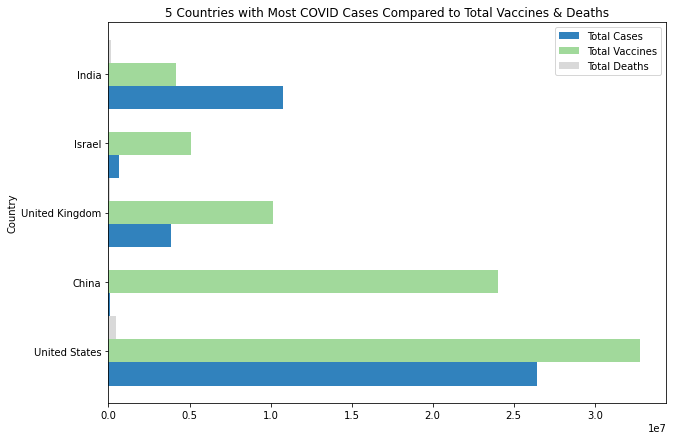

In [16]:
new_covid.head(5).plot.barh( 
    # size of the chart
    figsize = (10,7),
    # desired color scheme
    colormap = 'tab20c',
    # width of bars
    width= 1,
    # titling
    title = '5 Countries with Most COVID Vaccines Compared to Total Cases & Deaths')

In a similar comparison, I want to visualize the top 50 countries with the most cases, compared to vaccines and deaths, with a line graph:

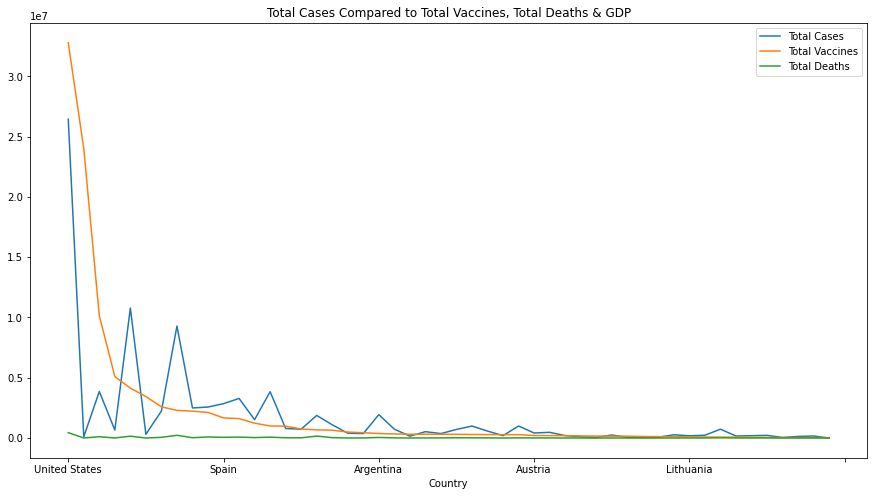

In [17]:
ax = new_covid.head(50).plot.line(
    figsize = (15, 8),
    # creating legend
    legend= True,
    title = 'Total Cases Compared to Total Vaccines, Total Deaths & GDP')

Both of these visuals reveal a GREAT deal to me. The US is no doubt most the most affected nation, in all aspects. However, the interesting part is the distribution of vaccines in nations that appear to not be _as_ affected compared to others (proportionately). Also these charts above reepresent the 'bad', I think we can produce better!

Below I will use the `new_covid` dataframe, which again is the totals, to plot the world based on Total cases:

In [18]:
list_countries = new_covid['Country'].unique().tolist()

fig = px.choropleth(data_frame = new_covid, 
                    # ISO is necessary in plotly as it has abuilt in world map based off of ISO codes
                    locations = "ISO",       
                    
                    # the column I want to depict the color
                    color = "Total Cases",
                    
                    # capped the cases at 26 million, as thats the most by a given country
                    range_color=[1, 30000000], 
                    
                    # what is shown when hovered over
                    hover_name = "Country",
                    
                    # selects the color for the scale
                    color_continuous_scale = 'sunset',
                    
                    # sets a different view of the world
                    projection = "natural earth")
#creating a title
fig.update_layout(title_text='Total Global COVID Cases (February 2nd 2021)')
                       
fig.show()

Similarly, I will creat a map but based on total vaccines rather than cases:

In [19]:


list_countries = new_covid['Country'].unique().tolist()

fig = px.choropleth(data_frame = new_covid, 
                    # ISO is necessary in plotly as it has abuilt in world map based off of ISO codes
                    locations = "ISO",       
                    
                    # the column I want to depict the color
                    color = "Total Vaccines",
                    
                    # capped the vaccine total at 33 million, as thats the most by a given country
                    range_color=[1,30000000], 
                    
                    # what is shown when hoevered over
                    hover_name = "Country",
                    
                    # selects the color for the scale
                    color_continuous_scale = 'sunset', 
                    
                    # sets a different view of the world
                    projection = "natural earth")
                   
#creating a title
fig.update_layout(
    title_text='Total Vaccines (February 2nd 2021)')
fig.show()

Below are scatter plots which depict the same as above, but I feel have a greater impact for comparison:

In [20]:
fig = px.scatter_geo(new_covid, locations='ISO', color='Total Cases', range_color =(0,26000000),
                     hover_name= 'Country', size="Total Cases", size_max = 65, color_continuous_scale = 'sunsetdark',
                     projection="natural earth")
#creating a title
fig.update_layout(
    title_text='Total COVID Cases by Country (February 2nd 2021)')
fig.show()

In [21]:
fig = px.scatter_geo(new_covid, locations='ISO', color='Total Vaccines', range_color =(0,26000000),
                     hover_name= 'Country', size="Total Vaccines", size_max = 65, color_continuous_scale = 'sunsetdark',
                     projection="natural earth")
#creating a title
fig.update_layout(
    title_text='Total COVID Vaccines By Country (February 2nd 2021)')
fig.show()

Ideally, I would need to work with the scale of the legend and scaling issues in general.

Reverting back to the original dataframe, `covidDaily`, I want to make an animated map with Plotly express that changes by day. 
<br/>To do so, I will use the `.unique()` command that only keeps 1 of the variables with the name and creates a list of the countries, without repeating one. This is important, as I made this similar note when making the `new_covid` dataframe. However, we can not use that trimmed dataframe because, to make an animated map, I need the repeated countries to show a progression over time.

In [22]:
covidDaily = covidDaily.sort_values(by='Date', ascending= True)
covidDaily.head(10)

,ISO,Continent,Country,Date,Total Cases,Total Cases per Million,Total Deaths,Total Deaths per Million,Total Vaccines,Total Vaccines per Hundred,Stringency Index,Population,GDP per Capita
36966,MEX,North America,Mexico,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,0.0,128932753.0,17336.469
2018,ARG,South America,Argentina,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,0.0,45195777.0,18933.907
2019,ARG,South America,Argentina,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,0.0,45195777.0,18933.907
36967,MEX,North America,Mexico,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,0.0,128932753.0,17336.469
2020,ARG,South America,Argentina,2020-01-03,NaN,NaN,NaN,NaN,NaN,NaN,0.0,45195777.0,18933.907
36968,MEX,North America,Mexico,2020-01-03,NaN,NaN,NaN,NaN,NaN,NaN,0.0,128932753.0,17336.469
36969,MEX,North America,Mexico,2020-01-04,NaN,NaN,NaN,NaN,NaN,NaN,0.0,128932753.0,17336.469
2021,ARG,South America,Argentina,2020-01-04,NaN,NaN,NaN,NaN,NaN,NaN,0.0,45195777.0,18933.907
56871,THA,Asia,Thailand,2020-01-04,NaN,NaN,NaN,NaN,NaN,NaN,0.0,69799978.0,16277.671
36970,MEX,North America,Mexico,2020-01-05,NaN,NaN,NaN,NaN,NaN,NaN,0.0,128932753.0,17336.469


This sorting put the dataframe in order, from oldest to newest. I did this so the animation wouldn't have any possible hiccups in hunting for the order of dates.

Now is the fun part: making the map and making it animated!
[This](https://plotly.github.io/plotly.py-docs/generated/plotly.express.choropleth.html) link is where I got the information on plotly express and the functions that work in the `px.choropleth()` figure:

In [23]:
# making an animated map via plotly express with a .csv file

list_countries = covidDaily['Country'].unique().tolist()

fig = px.choropleth(data_frame = covidDaily, 
                    # ISO is necessary in plotly in order to depict the map properly
                    locations = "ISO",       
                    color = "Total Cases",
                    # figure out how this works so the scale is consistent?
                    range_color=[1,26000000], 
                    hover_name = "Country",
                    # continuous scale as data is changing
                    color_continuous_scale = 'sunsetdark',
                    animation_frame = "Date")
fig.update_layout(
    title_text='Daily COVID Cases January 2020 - February 2021')
fig.show()

The `range_color`  keep the scale not so sliding so there is a more drastic change in color overtime.

Again, using the `.agg` expression based on the country, I will create a new `covidTotals` and aggregate the values in the desireed columns based on `max` value, so I know I am getting the most recent information (as for now COVID statistics continue to go up). To make it be more clear for cetain visualizations, I will fill Nan values with 0 to not affect future aggregations of the data with `.fillna(0)`.

In [24]:
# creating another copy of the OG dataframe. 
covidTotals = covidDaily.copy()

# trimming the dataframe by column name
columns_keeping = ['Continent','Country', 'Population', 'Total Cases', 'GDP per Capita', 'Total Deaths', 'Total Vaccines', 'Date']
covidTotals = covidTotals[columns_keeping]

# sorting the valuesin alphabetical order
covidTotals = covidTotals.sort_values(by='Country', ascending= True)

# filling Nan values with 0
covidTotals = covidTotals.fillna(0)

# this is the magic of .agg 
covidTotals = covidTotals.groupby(covidTotals['Country']).aggregate({'Continent': 'min',
                                                     'Country': 'min',
                                                     'Total Cases': 'max',
                                                     'Total Vaccines': 'max',
                                                     'Total Deaths': 'max',
                                                     'GDP per Capita': 'max'})
covidTotals.head(5)

,Continent,Country,Total Cases,Total Vaccines,Total Deaths,GDP per Capita
Country,,,,,,
Afghanistan,Asia,Afghanistan,55121.0,0.0,2405.0,1803.987
Albania,Europe,Albania,79934.0,0.0,1398.0,11803.431
Algeria,Africa,Algeria,107841.0,30.0,2898.0,13913.839
Andorra,Europe,Andorra,10017.0,1036.0,102.0,0.000
Angola,Africa,Angola,19900.0,0.0,468.0,5819.495


It is now in alphabetical order and the sums of all columns were taken, so they would be most recent totals. I did this because so much sorting was already done with the `new_covid` dataframe, to undo it all would be trival. Its find with me to keep another trimmed copy of the dataframe around to work with!

Now I want to see a bar comparing the newly add GDP variable, compared to cases, vaccines, deaths and GDP:

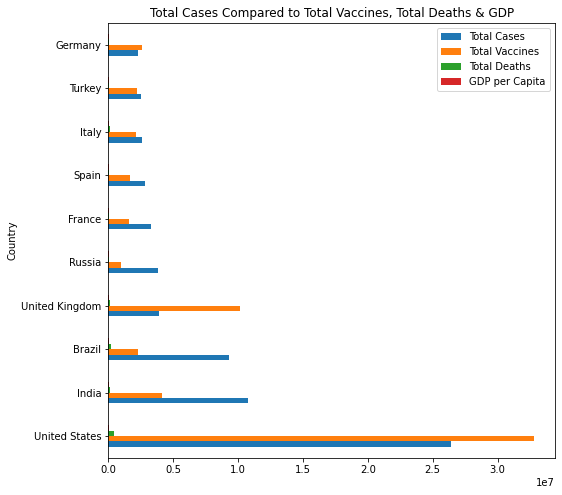

In [25]:
covidTotals = covidTotals.sort_values(by='Total Cases', ascending= False)

ax = covidTotals.head(10).plot.barh(
    # size of the figure
    figsize = (8, 8),
    # legend
    legend= True,
    # titling
    title = 'Total Cases Compared to Total Vaccines, Total Deaths & GDP')

This is a basic plot, kind of bland and makes me think of elementary school. LETS GET INTO IT!
Using plotly express, I can pimp the heck out of this and create a stacked bar graph of COVIDs effect, seperated by continent, to compare their countries to one another, based on the rrespective GDP per capita:

In [26]:
fig = px.bar(covidTotals, #dataframe used
             #to make it horizontal
             orientation="h", 
             
             # creating the x and y axes
             y="Continent", x="Total Cases", 
             
             # I want the color to represent the GDP per capita
             color="GDP per Capita",  
             
             # I want the color to change based on said GDP
             color_continuous_scale='Bluered_r', 
             
             # add the country's details via hover
             hover_name="Country",
             width= 1000, height= 500)


# adding a title
fig.update_layout(
    title_text='Continental COVID Cases Compared by GDP per Capita')
fig.show()

This shows a pretty clear visual of the impact of COVID on which nations. Recall, this `covidTotals` dataframe is sorted by total cases, so the largest section of a continent's bar is the most cases based on the x axis. Using a `hover_name` allows all the statics to be seen. I decided to seperate it by continent so the graph wouldnt have to have the same amount of bars as there are countries. However, I think it still shows a clear image of the pandemic's effects.

Now I want to create a scatterplot similarly comparing cases, vaccines and GDP by country:

In [27]:
fig = px.scatter(covidTotals, 
    # sets y and x axis variables
    y = "GDP per Capita",  x = "Total Cases",  
    
    #what the size of the scattered plots will represent
    size = "Total Vaccines",  
    
    #what the color will represent and the plots hover info
    color = "Continent",  
    hover_name = "Country",  
    
    # title of the variable each seperate column/chart will represent
    facet_col = "Continent", 
    
    # size of the largest point cannot go beyond this, helps with scale
    size_max = 65,
    
    # keeps the x axis in range of x varriables given
    log_x = True,
    #sets size of figure
    width= 1000, height= 500,
) 
# adding a title
fig.update_layout(
    title_text='COVID Vaccines compared to Total Cases & GDP per Capita')
fig.show()

In this scatterplot, the size of the marker represents the total amount of cases a country has. As you can see, or not, Oceana has mere specks as countries compared to the other continents. Moreover, the comparison is of Vaccine distribution and GDP per capita. A correlation between the two is not necessarily perfectly there, however the comparison is shocking. The countries with more vaccines do seem to have a higher GDP per capita than others. The comparison by continent is equally as interesting in this way; look at the size of the North America vs Afria. Its shocking.

In [28]:
fig = px.scatter(covidTotals, 
    # sets y and x axis variables
    y = "GDP per Capita",  x = "Total Cases",  
    
    #what the size of the scattered plots will represent
    size = "Total Vaccines",  
    
    #what the color will represent and the plots hover info
    color = "Total Vaccines",  
    hover_name = "Country",  
    
    # size of the largest point cannot go beyond this, helps with scale
    size_max = 70,
    
    # keeps the x axis in range of x varriables given
    log_x = True,
    #sets size of figure
    width = 999, height = 400,
) 
# adding a title
fig.update_layout(
    title_text='Vaccines Distribution compared to Total Cases & GDP per Capita')
fig.show()

Using a stacked histogram, I want to visualize just cases and vaccines:

In [29]:
fig = px.histogram(covidTotals.head(100), x = 'Total Vaccines', y = 'Total Cases', color = 'Country')

# adding a title
fig.update_layout(
    title_text = 'Top 100 Most Infected Countries Compared to COVID Vaccines')
fig.show()

This shows A LOT about the vaccine is distributed globally. I mean, somethiing is up with China, look at their vaccines (24M) versus their total cases (100k).

I believe this data exploration is ufficent enough to prove our research question, especially at this point in th epandemics reign.

Limitation: In the original `covidData` dataframe, there where 0 is listed, I believe it would most of the time be a Nan value, since I had ot aggregate the columns to get total of the rows (countries), Nan was replaced by 0.

## Group Roles:
Paige’s Role: I produced the data exploration and visualizations aspects of the project. Creating all the charts and maps used in our presentation on: COVID cases, COVID deaths, vaccines and economic effects of the pandemic (shown by differences in countries' GDP per Capita). These visualizations  show a clear picture of the global effect of COVID, both on a given country’s citizens as well as its respective economic climate. My goal was to help visualize COVID data, which changes ever so often, so it would be easier to identiffy if our research question was able to be confirmed or not.

Alessandro’s Role: I will produce the written content. Distributions of vaccines globally how does this compare with covid cases. 2 pages. Covid vaccines in different countries. COVID Vaccines and how they have spread. COVID deaths and the vaccines. I will provide a paragraph commentary explaining each of the visualizations made.

Together, we hoped to succesfully show a narrative that COVID, though effecting everyone, does so in unequal way and nations with lower economic rescources have been struggling to get vaccines to their people, where richer nations have more than enough (relatively).